In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import contourpy
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import FormatStrFormatter
import numpy as np
from _FigureJiazeHelper import *
from _DetectabilityWithMeta import *
from _CommunityDetect import *
from EXPERIMENT import *

%load_ext autoreload
%autoreload 2

In [2]:
# Matplotlib settings

# plt.style.use('seaborn-whitegrid')
plt.rc('figure', figsize=(8, 5))
plt.rc('font', size=10)
plt.rc('font', family='sans-serif')
plt.rcParams['font.sans-serif'] = 'verdana'
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.edgecolor'] = basic_line_color
plt.rcParams['xtick.color'] = basic_line_color
plt.rcParams['ytick.color'] = basic_line_color
plt.rcParams['axes.labelsize'] = 10  # 'large'
plt.rcParams['lines.markersize'] = 12
plt.rcParams['axes.linewidth'] = 0.5

# %matplotlib notebook
%config InlineBackend.figure_format = 'retina'

In [11]:
def contour_snr_ami(plot_snrnm, plot_fullami, ax, color='white'):
    amiCS = ax.contour(plot_fullami, levels=[1e-3], colors=color)
    snrCS = ax.contour(plot_snrnm, levels=[1], colors=color)
    ax.clabel(amiCS, fmt={1e-3: r'AMI$\simeq$0'}, inline=True, fontsize=10)
    ax.clabel(snrCS, fmt={1: 'SNR=1'}, inline=True, fontsize=10)

In [4]:
def selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False):
    save_path = None
    fig = plt.figure(figsize=(16, 32))
    widths = [8, 8]
    heights = [8, 8, 8, 8]
    spec5 = fig.add_gridspec(ncols=2, nrows=4, width_ratios=widths, height_ratios=heights)
    row = 0
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snrnm = color_imshow_2d(plot_rhos, plot_zs, snr_nm, z_center=1, title="SNR for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    row = 0
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    cmap = mpl.colormaps["plasma"] if clearcolor is False else mpl.colormaps['plasma'].resampled(2)
    zcenter = 0.5 if clearcolor is False else 1e-3
    plot_fullami = color_imshow_2d(plot_rhos, plot_zs, full_ami, z_center=zcenter, title="AMI for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap,  save_path=save_path, ax=ax, fig=fig)
    contour_snr_ami(plot_snrnm, plot_fullami, ax, color='orange' if clearcolor is True else 'white')
    
    row = 1
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snrm = color_imshow_2d(plot_rhos, plot_zs, snr_m, z_center=1, title="SNR for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    row = 1
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    cmap = mpl.colormaps["plasma"] if clearcolor is False else mpl.colormaps['plasma'].resampled(2)
    zcenter = 0.5 if clearcolor is False else 1e-3
    plot_subami = color_imshow_2d(plot_rhos, plot_zs, sub_ami, z_center=zcenter, title="AMI for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap,  save_path=save_path, ax=ax, fig=fig)
    contour_snr_ami(plot_snrm, plot_subami, ax, color='orange' if clearcolor is True else 'white')
    
    row = 2
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['coolwarm'].resampled(2)
    color_imshow_2d(plot_rhos, plot_zs, snr_m-snr_nm, z_center=0, title="SNR_sub - SNR_full", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    row = 2
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['coolwarm'].resampled(2)
    color_imshow_2d(plot_rhos, plot_zs, sub_ami-full_ami, z_center=0, title="AMI_sub - AMI_full", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    
    row = 3
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, full_num_group, z_center=3, title="Num of group for full", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=mpl.colormaps["cool"], save_path=save_path, ax=ax, fig=fig)
    row = 3
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    color_imshow_2d(plot_rhos, plot_zs, sub_num_group, z_center=4, title="Num of group for sub", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=mpl.colormaps["cool"], save_path=save_path, ax=ax, fig=fig)

In [5]:
def selfplot_labelpropagate(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False):
    save_path = None
    fig = plt.figure(figsize=(16, 16))
    widths = [8, 8]
    heights = [8, 8]
    spec5 = fig.add_gridspec(ncols=2, nrows=2, width_ratios=widths, height_ratios=heights)
    row = 0
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snrnm = color_imshow_2d(plot_rhos, plot_zs, snr_nm, z_center=1, title="SNR for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    row = 0
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    cmap = mpl.colormaps["plasma"] if clearcolor is False else mpl.colormaps['plasma'].resampled(2)
    zcenter = 0.5 if clearcolor is False else 1e-3
    plot_fullami = color_imshow_2d(plot_rhos, plot_zs, full_ami, z_center=zcenter, title="AMI for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap,  save_path=save_path, ax=ax, fig=fig)
    contour_snr_ami(plot_snrnm, plot_fullami, ax, color='orange' if clearcolor is True else 'white')
    
    row = 1
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snrm = color_imshow_2d(plot_rhos, plot_zs, snr_m, z_center=1, title="SNR for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    row = 1
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    cmap = mpl.colormaps["plasma"] if clearcolor is False else mpl.colormaps['plasma'].resampled(2)
    zcenter = 0.5 if clearcolor is False else 1e-3
    plot_subami = color_imshow_2d(plot_rhos, plot_zs, sub_ami, z_center=zcenter, title="AMI for full graph by labelpropagate", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap,  save_path=save_path, ax=ax, fig=fig)
    contour_snr_ami(plot_snrm, plot_subami, ax, color='orange' if clearcolor is True else 'white')

In [10]:
def contour_data(data, ax, levels, fmt, color='white', linestyle=None):
    CS = ax.contour(data, levels=levels, colors=color, linewidths=1.5, linestyles=linestyle)
    ax.clabel(CS, fmt=fmt, inline=1, fontsize=9)
    handles, labels = CS.legend_elements()
    return handles


In [23]:
def subgraph_snr_ami_plot(sub_ami, snr_m, snr_sub_big, snr_sub_combine, clearcolor=False):
    save_path=None
    fig = plt.figure(figsize=(16, 16))
    widths = [8, 8]
    heights = [8, 8]
    spec5 = fig.add_gridspec(ncols=2, nrows=2, width_ratios=widths, height_ratios=heights)
    row = 0
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snrm = color_imshow_2d(plot_rhos, plot_zs, snr_m, z_center=1, title="SNR for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    
    row = 0
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snr_bigsubsub = color_imshow_2d(plot_rhos, plot_zs, snr_sub_big, z_center=1, title="SNR for big sub_sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    
    row = 1
    col = 0
    ax = fig.add_subplot(spec5[row, col])
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snr_subcombine = color_imshow_2d(plot_rhos, plot_zs, snr_sub_combine, z_center=1, title="SNR for big&small subsub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, save_path=save_path, ax=ax, fig=fig)
    
    row = 1
    col = 1
    ax = fig.add_subplot(spec5[row, col])
    cmap = mpl.colormaps["plasma"] if clearcolor is False else mpl.colormaps['plasma'].resampled(2)
    zcenter = 0.5 if clearcolor is False else 1e-3
    plot_subami = color_imshow_2d(plot_rhos, plot_zs, sub_ami, z_center=zcenter, title="AMI for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap,  save_path=save_path, ax=ax, fig=fig)
    amiupper = 0.999
    contour_data(plot_subami, ax, levels=[amiupper], fmt={amiupper: rf'AMI$\simeq${amiupper}'}, color='blue')
    contour_data(plot_subami, ax, levels=[1e-3], fmt={1e-3: r'AMI$\simeq$0'}, color='white')
    contour_data(plot_snrm, ax, levels=[1], fmt={1: r'$SNR_{sub}=1$'}, color='green')
    contour_data(plot_snr_subcombine, ax, levels=[1], fmt={1: r'$SNR_{subc}=1$'}, color='red')
#     contour_data(plot_snr_subcombine, ax, levels=[3], fmt={3: r'$SNR_{subc}=3$'}, color='red')

In [17]:
def all_contour_plot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, title="", xlabel="", ylabel="", 
                     clearcolor=False, legend=False, fig=None, ax=None):
    filter_index = np.where(plot_zs<=0.0055)[0]
    plot_rhos = plot_rhos[filter_index]
    plot_zs = plot_zs[filter_index]
    sub_ami = sub_ami[filter_index]
    full_ami = full_ami[filter_index]
    snr_nm = snr_nm[filter_index]
    snr_m = snr_m[filter_index]
#     betterfull = 1*((sub_ami <= 1e-3) & (full_ami >= 1e-3))
#     bettersub = 1*((sub_ami >= 1e-3) & (full_ami <= 1e-3))
    
    
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snrnm = color_imshow_2d(plot_rhos, plot_zs, snr_nm, z_center=1, title="SNR for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, return_gridz=True)
    
    cmap = mpl.colormaps["plasma"] if clearcolor is False else mpl.colormaps['plasma'].resampled(2)
    zcenter = 0.5 if clearcolor is False else 1e-3
    plot_fullami = color_imshow_2d(plot_rhos, plot_zs, full_ami, z_center=zcenter, title="AMI for full graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, return_gridz=True)
    
    
    cmap = cm.coolwarm if clearcolor is False else mpl.colormaps['bwr'].resampled(2)
    plot_snrm = color_imshow_2d(plot_rhos, plot_zs, snr_m, z_center=1, title="SNR for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, return_gridz=True)
    
    save_path = None
    if fig is None and ax is None:
        fig = plt.figure(figsize=(4, 4))
        widths = [6]
        heights = [6]
        spec5 = fig.add_gridspec(ncols=1, nrows=1, width_ratios=widths, height_ratios=heights)
        row = 0
        col = 0
        ax = fig.add_subplot(spec5[row, col])
    else:
        fig = fig
        ax = ax
    cmap = mpl.colormaps["plasma"] if clearcolor is False else mpl.colormaps['plasma'].resampled(2)
    zcenter = 0.5 if clearcolor is False else 1e-3
    plot_subami = color_imshow_2d(plot_rhos, plot_zs, sub_ami, z_center=zcenter, title="AMI for sub graph", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, return_gridz=True)
    
    print(ax)
    handels = []
    handels += contour_data(plot_fullami, ax, levels=[1e-3], fmt={1e-3: r'$AMI_{full}\simeq$0'}, color='#ffaa00')
    handels += contour_data(plot_snrnm, ax, levels=[1], fmt={1: r'$SNR_{full}=1$'}, color='#ffaa00', linestyle='dashed')
    handels += contour_data(plot_subami, ax, levels=[1e-3], fmt={1e-3: r'$AMI_{sub}\simeq$0'}, color='#009ade')
    handels += contour_data(plot_snrm, ax, levels=[1], fmt={1: r'$SNR_{sub}=1$'}, color='#009ade', linestyle='dashed')
    cmap = LinearSegmentedColormap.from_list('mylist', ['#ffffff', '#00b000'], N=2)
#     betterfull = color_imshow_2d(plot_rhos, plot_zs, betterfull, z_center=zcenter, title="", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, return_gridz=True)
#     bettersub = color_imshow_2d(plot_rhos, plot_zs, bettersub, z_center=zcenter, title="", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, return_gridz=True)
#     ax.contourf(betterfull, 1, hatches=['', '//'], alpha=0)
#     ax.contourf(bettersub, 1, hatches=['', '\\'], alpha=0)
#     ax.imshow(betterfull)
#     ax.imshow(bettersub)
    contour_fullami = contourpy.contour_generator(z=plot_fullami).lines(1e-3)
    contour_subami = contourpy.contour_generator(z=plot_subami).lines(1e-3)
#     print(contour_fullami, contour_subami)
    i = 0
    for line_fullami, line_subami in zip(contour_fullami, contour_subami):
        # Construct a polygon from the two contour lines
#         print(np.abs(line_subami[:, 1]), np.abs(np.average(line_fullami[:, 1])))
        if i == 1:
            betterfull_subindex = np.where(np.average(line_fullami[:, 1])<=line_subami[:, 1])[0]
#             bettersub_subindex = np.where(np.average(line_fullami[:, 1])>=line_subami[:, 1])[0]
        else:
            betterfull_subindex = np.where(np.average(line_fullami[:, 1])>=line_subami[:, 1])[0]
#             bettersub_subindex = np.where(np.average(line_fullami[:, 1])<=line_subami[:, 1])[0]
        min_rho, max_rho = np.min(line_subami[betterfull_subindex, :][:, 0]), np.max(line_subami[betterfull_subindex, :][:, 0]) # min and max rho for subami in this part
        betterfull_fullindex = np.where((min_rho<=line_fullami[:, 0]) & (line_fullami[:, 0]<=max_rho))[0]
        better_full_polygon = np.concatenate([line_fullami[betterfull_fullindex, :], line_subami[betterfull_subindex, :][::-1]], axis=0)
#         print(better_full_polygon[:, 0], better_full_polygon[:, 1])
        ax.fill(better_full_polygon[:, 0], better_full_polygon[:, 1], fc="red", alpha=0.5, ec=None)
#         print(min_rho, max_rho)
        bettersub_fullindex = np.where(min_rho>line_fullami[:, 0])[0]
        bettersub_subindex = np.where(min_rho>line_subami[:, 0])[0]
        
        better_sub_polygon = np.concatenate([line_fullami[bettersub_fullindex, :], line_subami[bettersub_subindex, :][::-1]], axis=0)
#         print(better_sub_polygon[:, 0], '\n', better_sub_polygon[:, 1])
        ax.fill(better_sub_polygon[:, 0], better_sub_polygon[:, 1], fc="skyblue", alpha=0.5, ec=None)
        
        bettersub_fullindex = np.where((max_rho<line_fullami[:, 0]))[0]
        bettersub_subindex = np.where((max_rho<line_subami[:, 0]))[0]
        better_sub_polygon = np.concatenate([line_fullami[bettersub_fullindex, :], line_subami[bettersub_subindex, :][::-1]], axis=0)
        ax.fill(better_sub_polygon[:, 0], better_sub_polygon[:, 1], fc="skyblue", alpha=0.5, ec=None)
        i += 1
    
    
    ax.set_title(title, fontsize=30)
    ax.set_xlabel(xlabel, fontsize=20)
    ax.set_ylabel(ylabel, rotation='horizontal', fontsize=20)
    # ax.set_xlim(np.min(x), np.max(x))
    # ax.set_ylim(np.min(y), np.max(y))
    # print(f'{np.min(y)}, {np.max(y)}')
    x, y = plot_rhos, plot_zs
    ax.set_xticks(np.linspace(0, np.size(np.sort(np.unique(x)))-1, 3), np.around(np.linspace(np.min(x), np.max(x), 3), 3), fontsize=10)
    yticks_num = int(np.size(np.unique(y)) / 3)
    ax.set_yticks(np.linspace(0, np.size(np.sort(np.unique(y))) - 1, yticks_num), np.around(np.linspace(np.min(y), np.max(y), yticks_num), 3), fontsize=10)
    if legend:
        plt.legend(handels, [r'$AMI_{full}\simeq$0', r'$SNR_{full}=1$', r'$AMI_{sub}\simeq$0', r'$SNR_{sub}=1$'])

## N=12000 d=50 t=10(t=50 for delta=[-0.005, 0.0055]) noDC noGivenNumGroup

In [3]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = False
DC = False
HelpWithFull = False
LabelPropagate = False
fileId = 'amiExp5.17' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
addfileId = 'amiExp8.8' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
                 f'{"givenNumGroup" if givenNumGroup else ""}_' + \
                 f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' + \
                 f'{"LabelPropagate" if LabelPropagate else ""}' + '_add'
addload_path = "./result/detectabilityWithMeta/" + addfileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=False, add_path=addload_path)

EXP amiExp5.17_n=12000_X=2_Z=3_d=50_snr noGivenNumGroup add


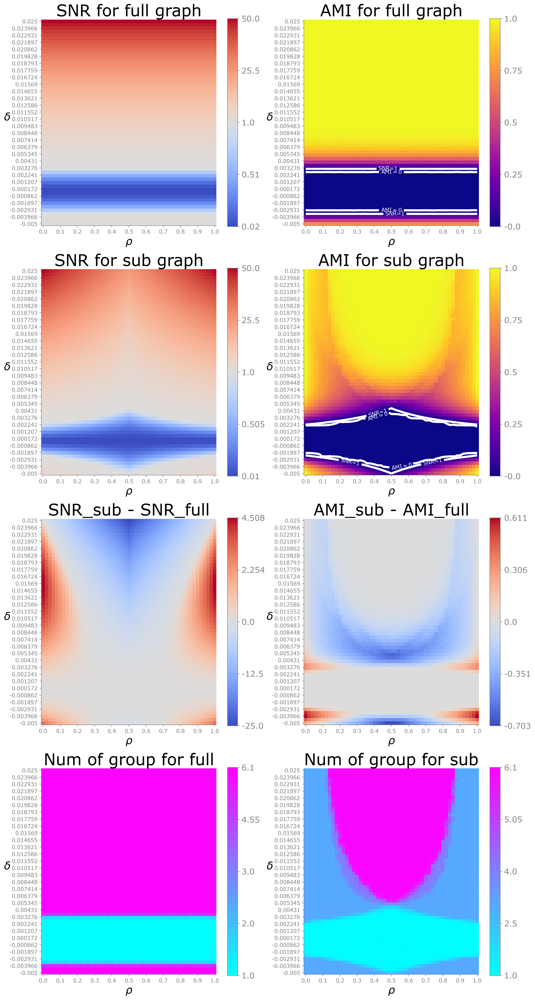

In [87]:
print(f"EXP {fileId} noGivenNumGroup add")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)
# save_path = "./_Figure/" + fileId + "_noGivenNumGroup.png"
# plt.tight_layout()
# plt.savefig(save_path, dpi=600)

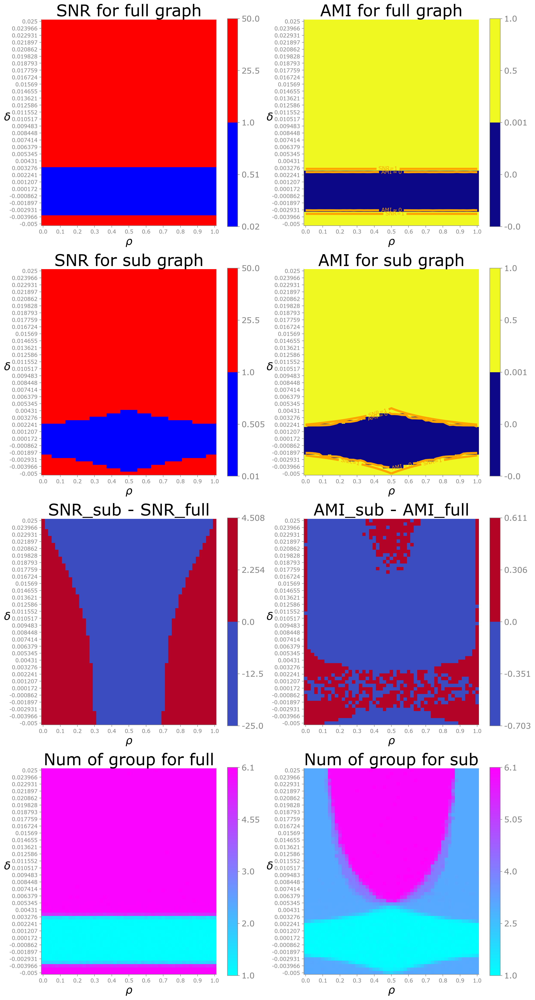

In [92]:
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=True)

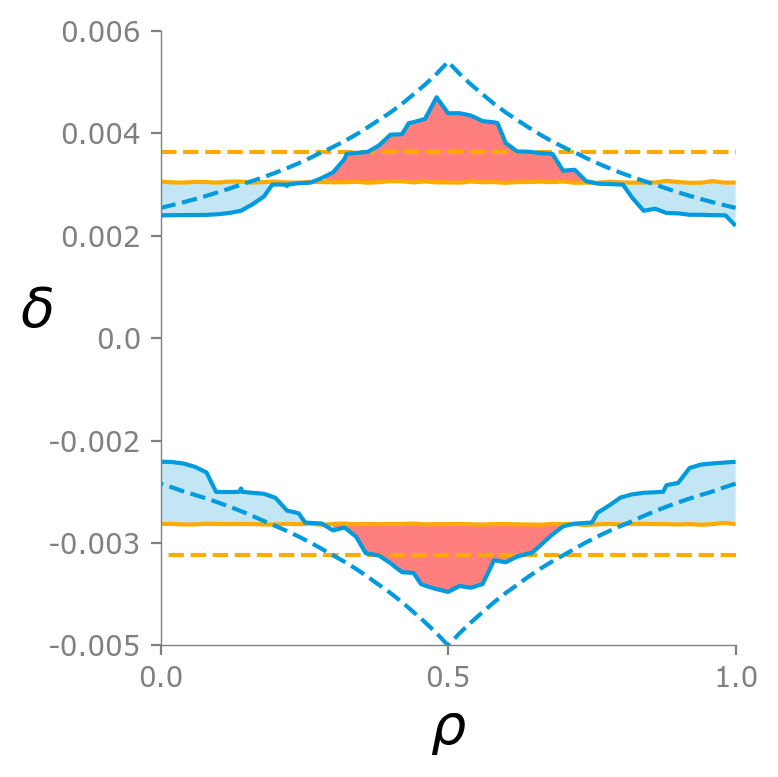

In [28]:
all_contour_plot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, 
                 title="", xlabel=r'$\rho$', ylabel=r'$\delta$', clearcolor=False, legend=False)

save_path = "./_Figure/" + fileId + "_noGivenNumGroup" + "_contour" + "v1.pdf"
plt.tight_layout()
plt.savefig(save_path, dpi=600)


In [11]:
rho = np.setdiff1d(np.around(np.linspace(0, 1, 51), 2), np.array([]))
min_delta, max_delta = get_range_delta(d, n, X, Z)
delta = np.setdiff1d(np.around(np.linspace(min_delta, max_delta, int((max_delta-min_delta)/0.0005)+1), 5), np.array([0]))
asymmetry = np.zeros(np.size(delta)*np.size(rho))
SNR_m_bigsubsub = np.zeros(np.size(delta)*np.size(rho))
SNR_m_smallsubsub = np.zeros(np.size(delta)*np.size(rho))
SNR_m_combine0 = np.zeros(np.size(delta)*np.size(rho))
SNR_m_combine1 = np.zeros(np.size(delta)*np.size(rho))
SNR_m_combine3 = np.zeros(np.size(delta)*np.size(rho))
SNR_m_exact = np.zeros(np.size(delta)*np.size(rho))
i = 0
for _rho in rho:
    for _delta in delta:
        asymmetry[i] = _rho * (1-_rho)
        pin = d/n+_delta-_delta/(2*Z)
        pout = d/n-_delta/(2*Z)
        pin = 0 if pin < 1e-10 else pin
        pout = 0 if pout < 1e-10 else pout
#         print(n, d, _delta, pin, pout)
        SNR_m_bigsubsub[i] = (_rho * n**2 * _delta**2) / (2 * Z**2 * d + n * Z * _delta)
        SNR_m_smallsubsub[i] = ((1-_rho) * n**2 * _delta**2) / (2 * Z**2 * d + n * Z * _delta)
        SNR_m_combine0[i] = _rho * SNR_m_bigsubsub[i] + (1-_rho) * SNR_m_smallsubsub[i]
#         SNR_m_combine1[i] =  SNR_m_bigsubsub[i] +  SNR_m_smallsubsub[i]
        if _rho < 1/2:
            SNR_m_combine3[i] = _rho * SNR_m_bigsubsub[i]
            SNR_m_combine1[i] = _rho/(1+_rho) * SNR_m_bigsubsub[i] + 1/(1+_rho) * snr_m[i]
            SNR_m_exact[i] = _rho * ((np.sqrt(pin)-np.sqrt(pout))**2) * (n / (2*Z*np.log(n/2)))
        else:
            SNR_m_combine3[i] = (1-_rho) * SNR_m_smallsubsub[i]
            SNR_m_combine1[i] = (1-_rho)/(2-_rho) * SNR_m_smallsubsub[i] + 1/(2-_rho) * snr_m[i]
            SNR_m_exact[i] = (1-_rho) * ((np.sqrt(pin)-np.sqrt(pout))**2) * (n / (2*Z*np.log(n/2)))
        i+=1

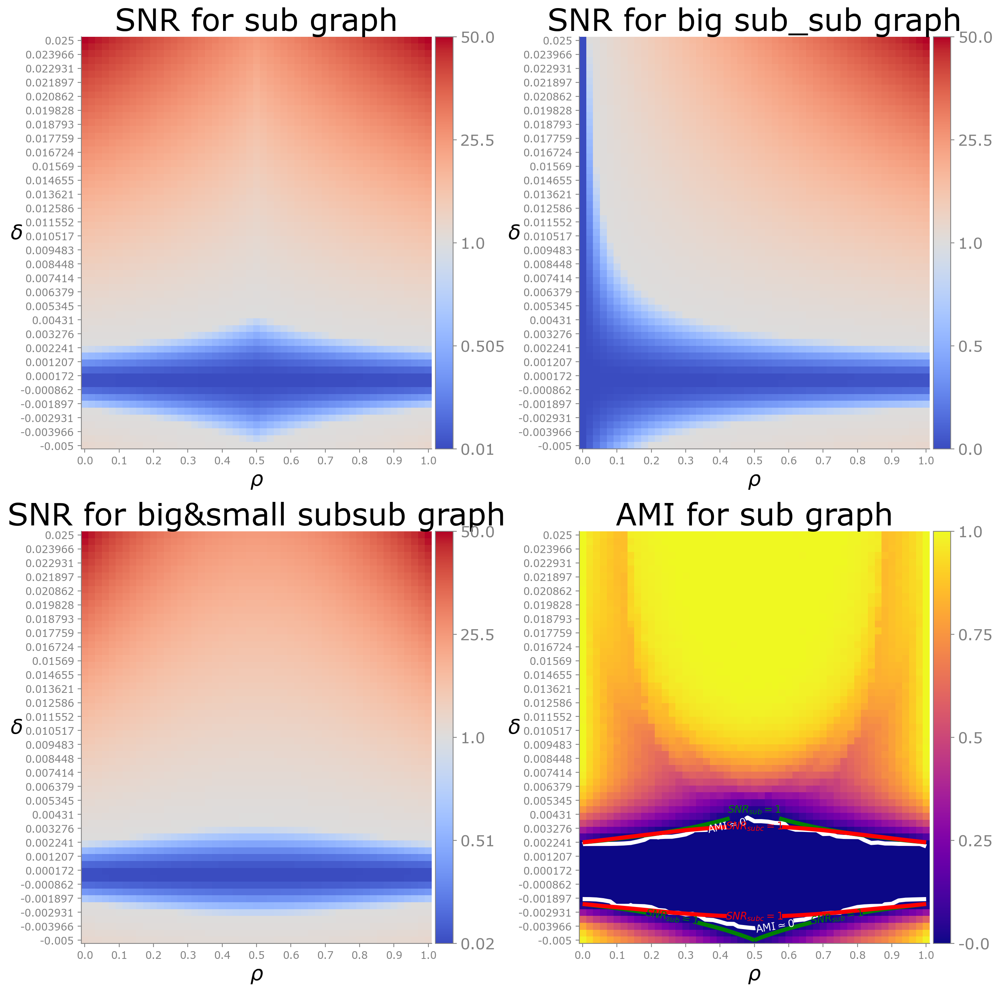

In [57]:
subgraph_snr_ami_plot(sub_ami, snr_m, SNR_m_bigsubsub, SNR_m_combine0)

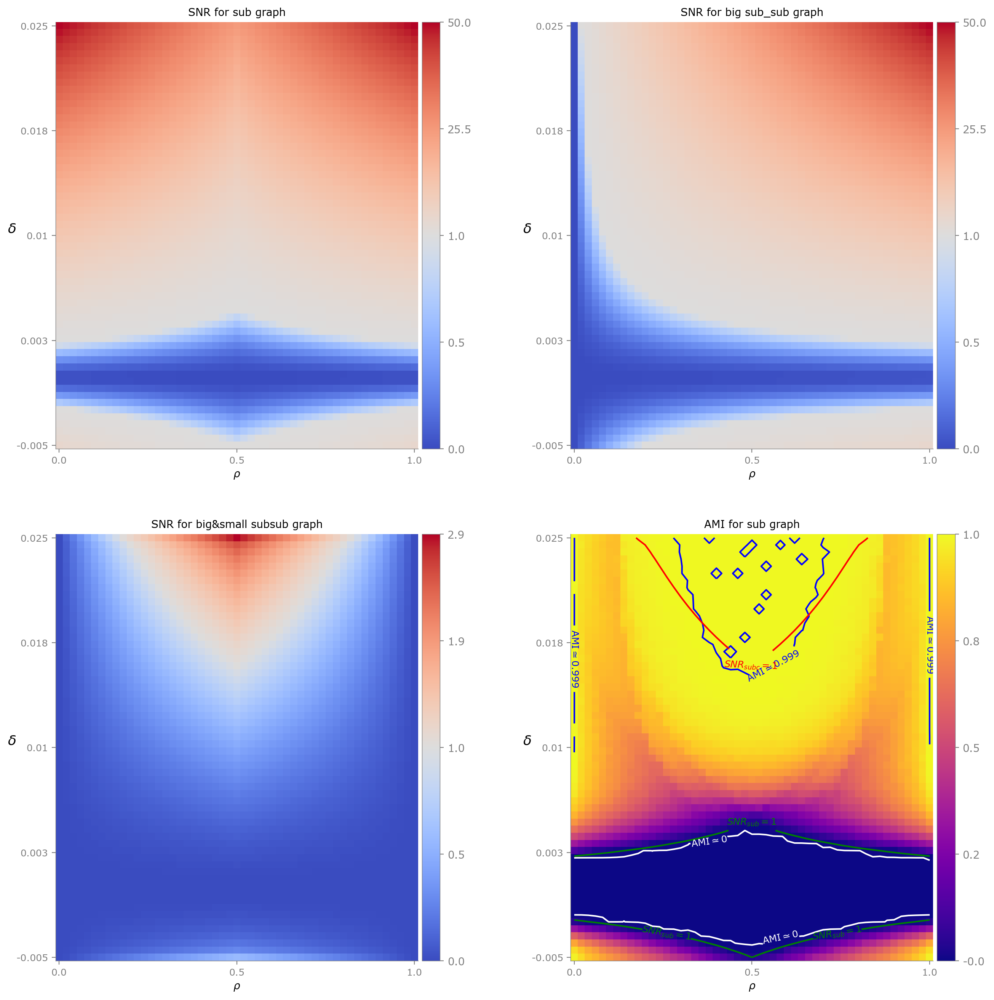

In [24]:
subgraph_snr_ami_plot(sub_ami, snr_m, SNR_m_bigsubsub, SNR_m_exact)

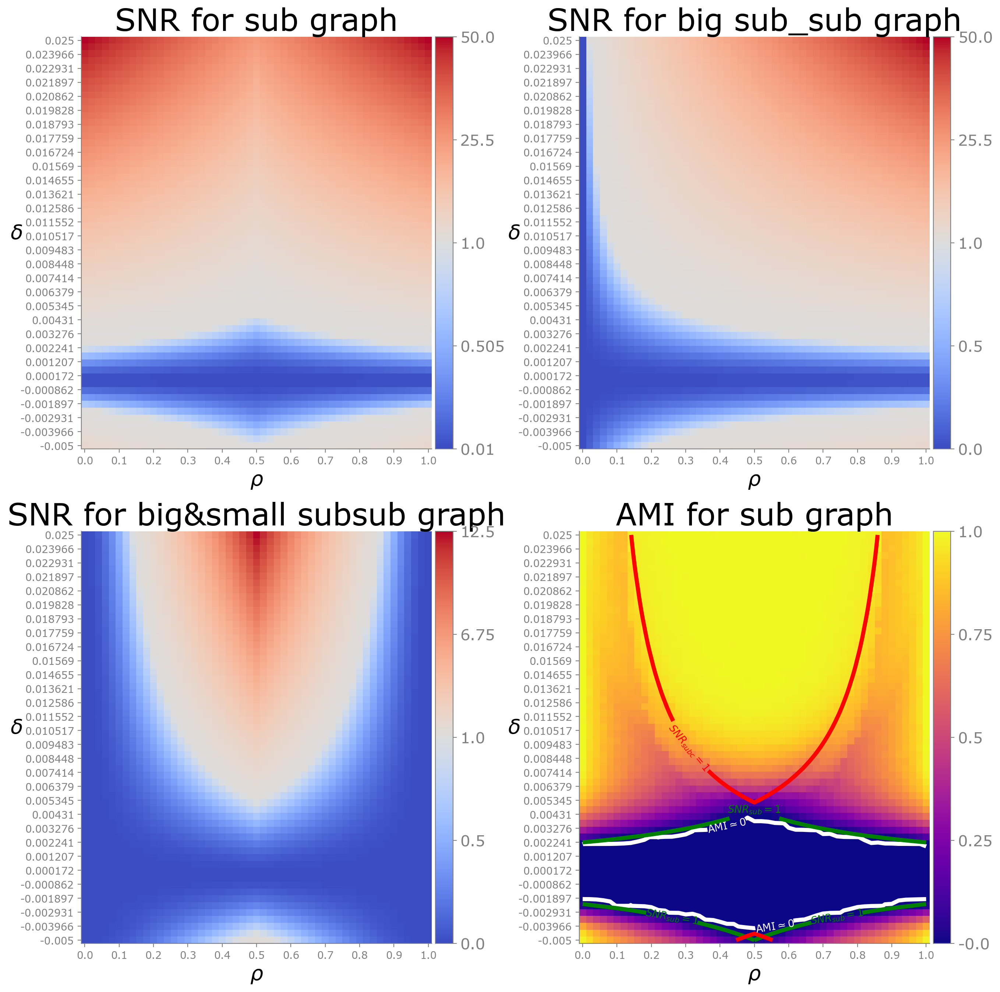

In [58]:
subgraph_snr_ami_plot(sub_ami, snr_m, SNR_m_bigsubsub, SNR_m_combine3)

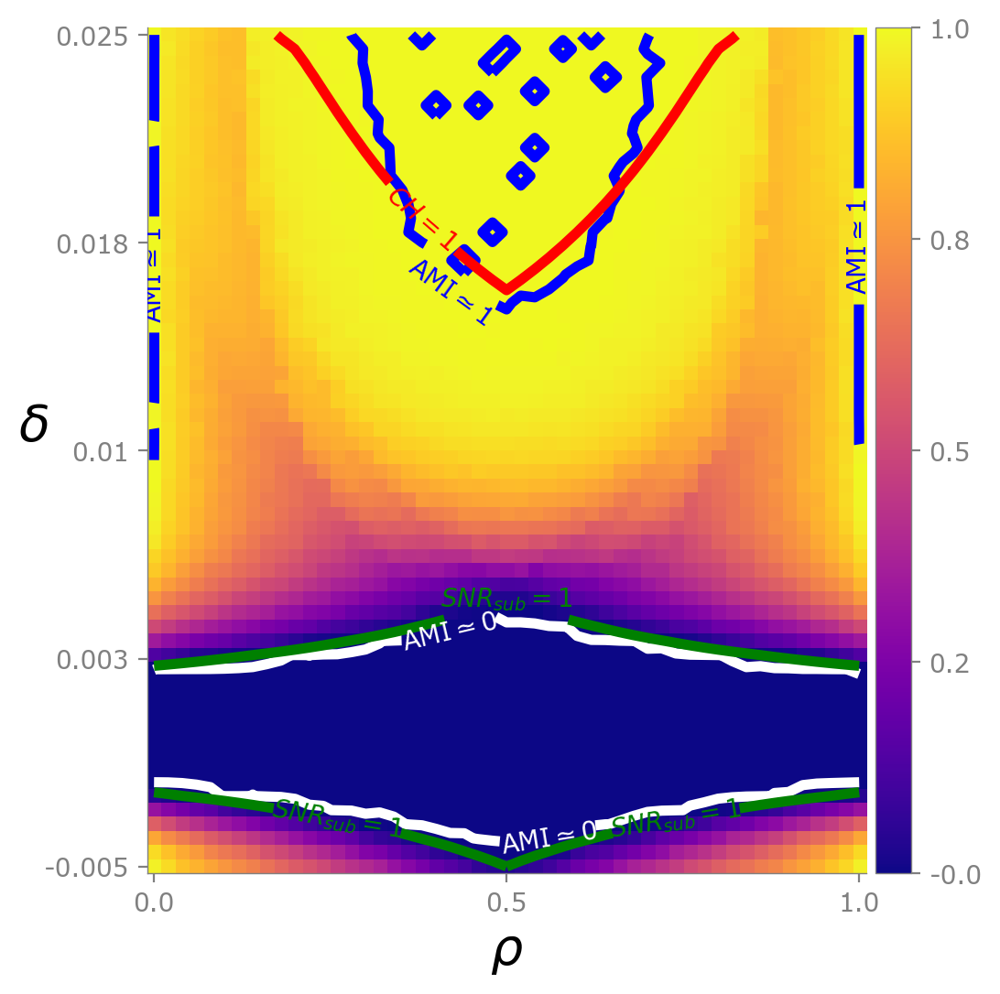

In [14]:
fig = plt.figure(figsize=(6, 6))
widths = [6]
heights = [6]
spec5 = fig.add_gridspec(ncols=1, nrows=1, width_ratios=widths, height_ratios=heights)
row = 0
col = 0
ax = fig.add_subplot(spec5[row, col])
cmap = mpl.colormaps["plasma"]
zcenter = 0.5
plot_subami = color_imshow_2d(plot_rhos, plot_zs, sub_ami, z_center=zcenter, title="", xlabel=r'$\rho$', ylabel=r'$\delta$', cmap=cmap, ax=ax, fig=fig)
amiupper = 0.999
contour_data(plot_subami, ax, levels=[amiupper], fmt={amiupper: rf'AMI$\simeq$1'}, color='blue')
contour_data(plot_subami, ax, levels=[1e-3], fmt={1e-3: r'AMI$\simeq$0'}, color='white')
plot_snrm = color_imshow_2d(plot_rhos, plot_zs, snr_m, z_center=1, return_gridz=True)
plot_ch_exact = color_imshow_2d(plot_rhos, plot_zs, SNR_m_exact, z_center=1, return_gridz=True)
contour_data(plot_snrm, ax, levels=[1], fmt={1: r'$SNR_{sub}=1$'}, color='green')
contour_data(plot_ch_exact, ax, levels=[1], fmt={1: r'$CH=1$'}, color='red')
# save_path = "./_Figure/" + fileId + "_noGivenNumGroup" + "_subami" + ".pdf"
# plt.tight_layout()
# plt.savefig(save_path, dpi=600)

min=-1.9e-05, max=1.0
0.0, 0.25


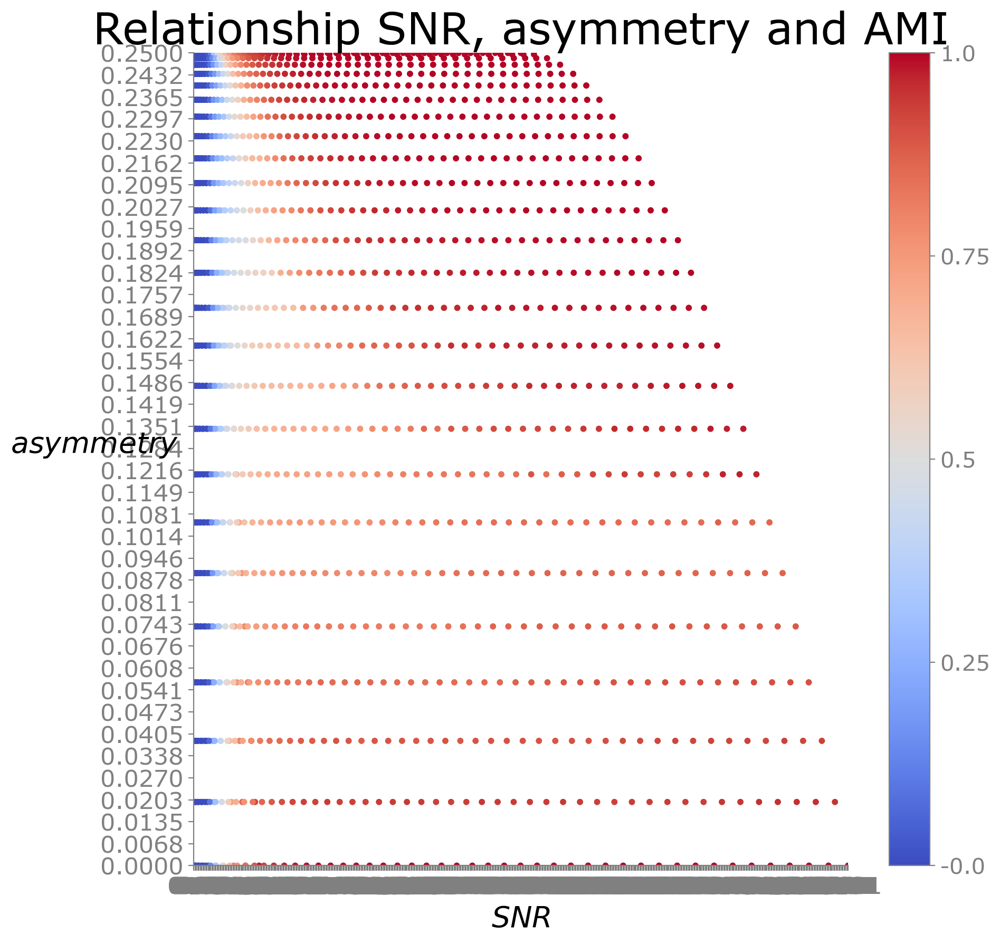

In [65]:
color_scatter_2d(x=snr_m, y=asymmetry, z=sub_ami, z_center=0.5, title="Relationship SNR, asymmetry and AMI", xlabel=r'$SNR$', ylabel=r'$asymmetry$', min_z=None, max_z=None, cmap=cm.coolwarm, save_path=None, ax=None, fig=None)


26 asymmetry[8]=0.1344


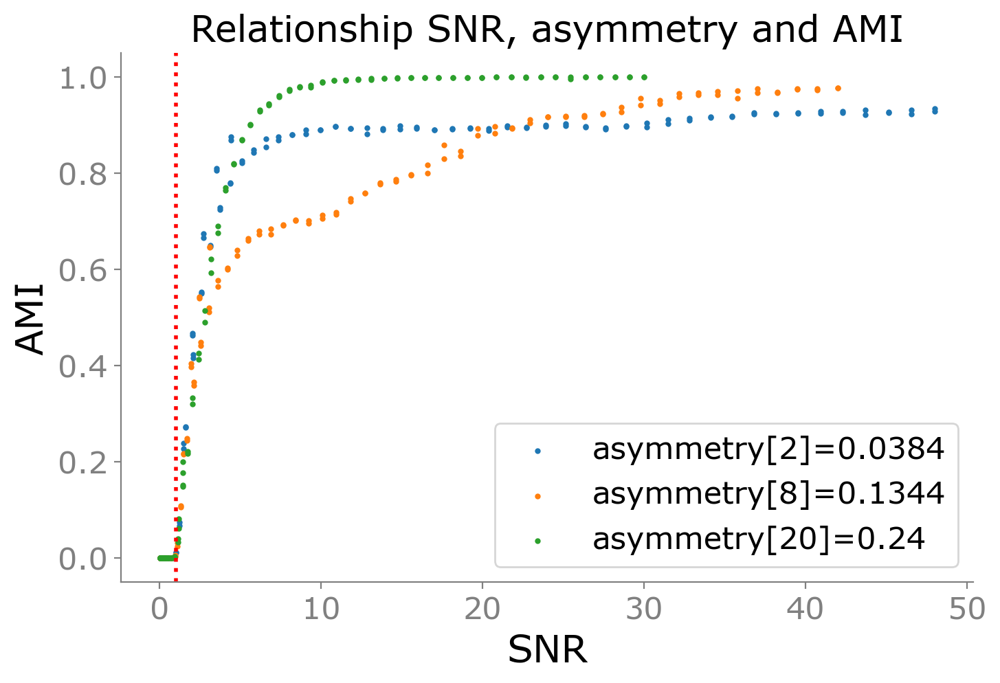

In [67]:
i = 8
asymmetry = np.around(asymmetry, 4)
# print(np.unique(asymmetry))
print(len(np.unique(asymmetry)), f"asymmetry[{i}]={str(np.unique(asymmetry)[i])}")
for i in [2, 8, 20]:
    index = np.where(asymmetry==np.unique(asymmetry)[i])[0]
    # print(sub_ami[index])
    plt.scatter(snr_m[index], sub_ami[index], s=4, label=f'asymmetry[{i}]={str(np.unique(asymmetry)[i])}')
plt.xlabel(f'SNR')
plt.ylabel(f'AMI')
plt.title(f'Relationship SNR, asymmetry and AMI')
plt.axvline(1, color="r", linestyle=':', linewidth=2)
plt.legend()



## N=12000 d=50 t=10(t=50 for delta=[-0.005, 0.0055]) SubHelpedwithFull noDC noGivenNumGroup

In [29]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = False
DC = False
HelpWithFull = True
LabelPropagate = False
fileId = 'amiExp6.12' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' \
                            f'{"givenNumGroup" if givenNumGroup else ""}_' \
                            f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
addfileId = 'amiExp8.8' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
                 f'{"givenNumGroup" if givenNumGroup else ""}_' + \
                 f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' + \
                 f'{"LabelPropagate" if LabelPropagate else ""}' + '_add'
addload_path = "./result/detectabilityWithMeta/" + addfileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=False, add_path=addload_path)

EXP amiExp6.12_n=12000_X=2_Z=3_d=50_snr___HelpWithFull noGivenNumGroup add


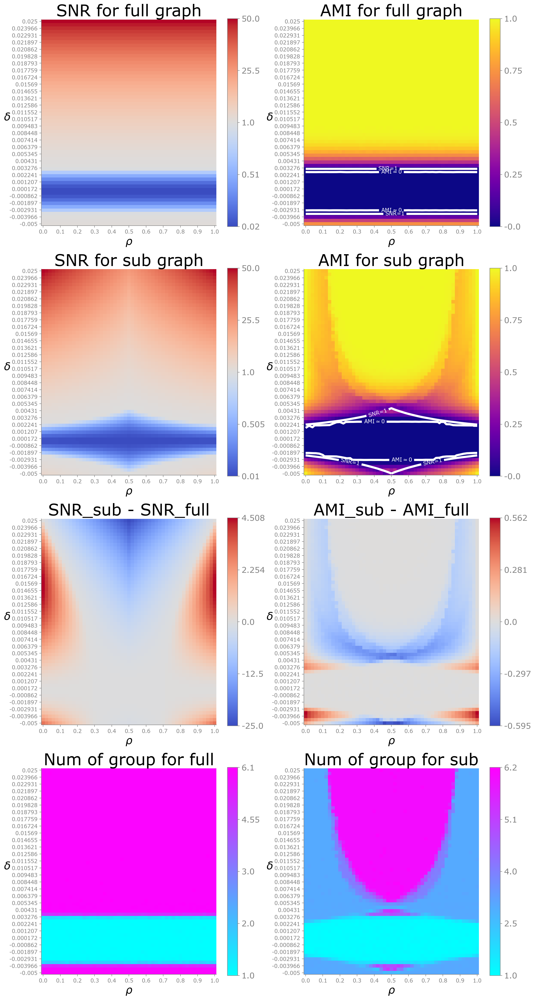

In [8]:
print(f"EXP {fileId} noGivenNumGroup add")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)

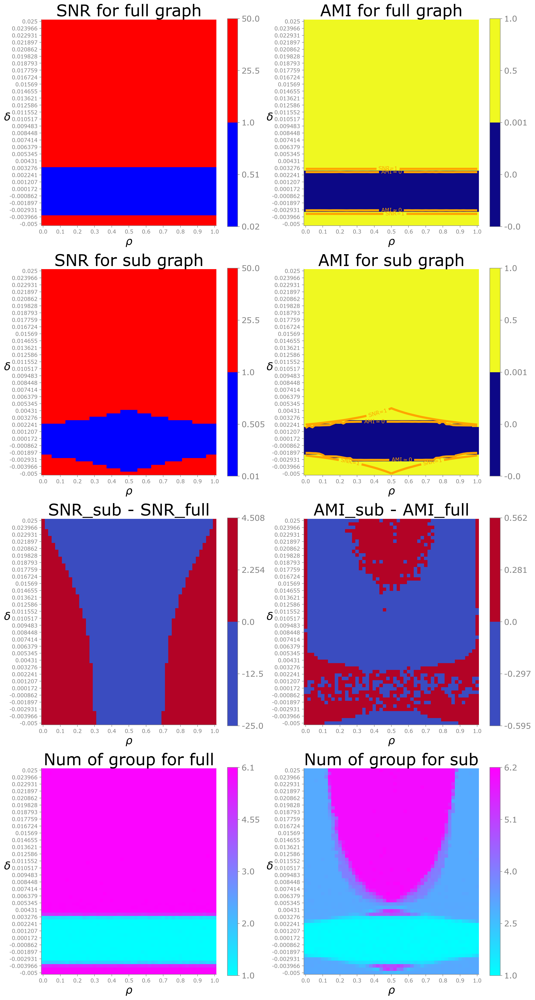

In [9]:
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=True)

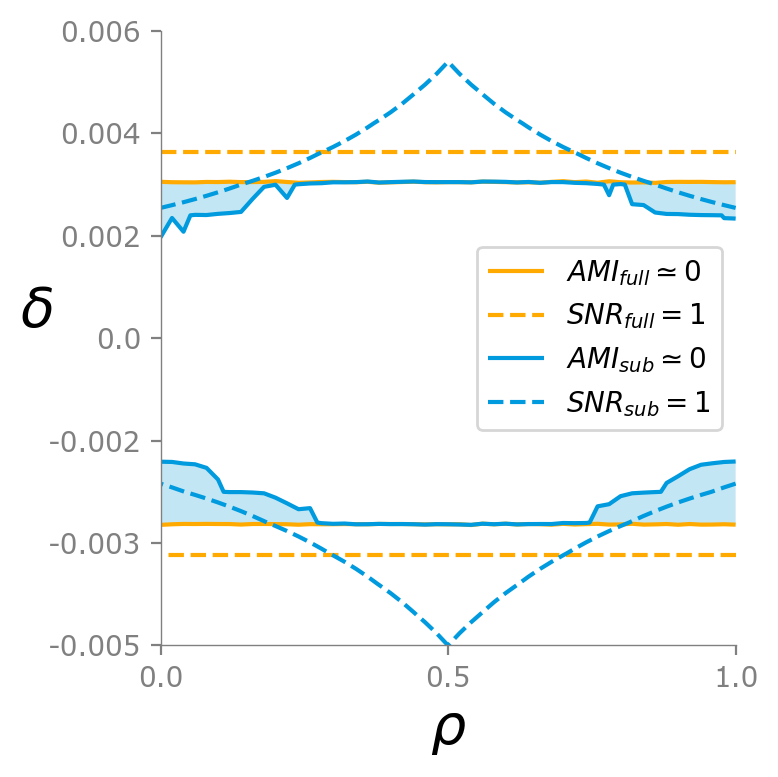

In [30]:
all_contour_plot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, 
                 title="", xlabel=r'$\rho$', ylabel=r'$\delta$', clearcolor=False, legend=True)
save_path = "./_Figure/" + fileId + "_noGivenNumGroup" + "_contour" + "v1.pdf"
plt.tight_layout()
plt.savefig(save_path, dpi=600)

## N=12000 d=50 t=10(t=50 for delta=[-0.005, 0.0055]) FullLabelPropgateBySub noDC noGivenNumGroup

In [13]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = False
DC = False
HelpWithFull = False
LabelPropagate = True
fileId = 'amiExp6.12' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' \
                 f'{"givenNumGroup" if givenNumGroup else ""}_' \
                 f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' \
                 f'{"LabelPropagate" if LabelPropagate else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
addfileId = 'amiExp8.8' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
                 f'{"givenNumGroup" if givenNumGroup else ""}_' + \
                 f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' + \
                 f'{"LabelPropagate" if LabelPropagate else ""}' + '_add'
addload_path = "./result/detectabilityWithMeta/" + addfileId + ".txt"
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=False, add_path=addload_path)

EXP amiExp6.12_n=12000_X=2_Z=3_d=50_snr____LabelPropagate noGivenNumGroup add


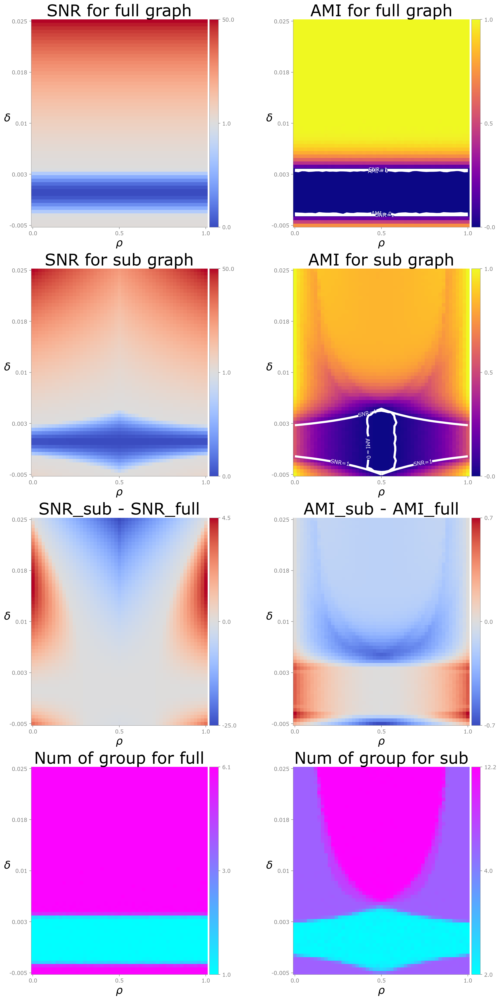

In [14]:
print(f"EXP {fileId} noGivenNumGroup add")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)

EXP amiExp6.12_n=12000_X=2_Z=3_d=50_snr____LabelPropagate noGivenNumGroup add


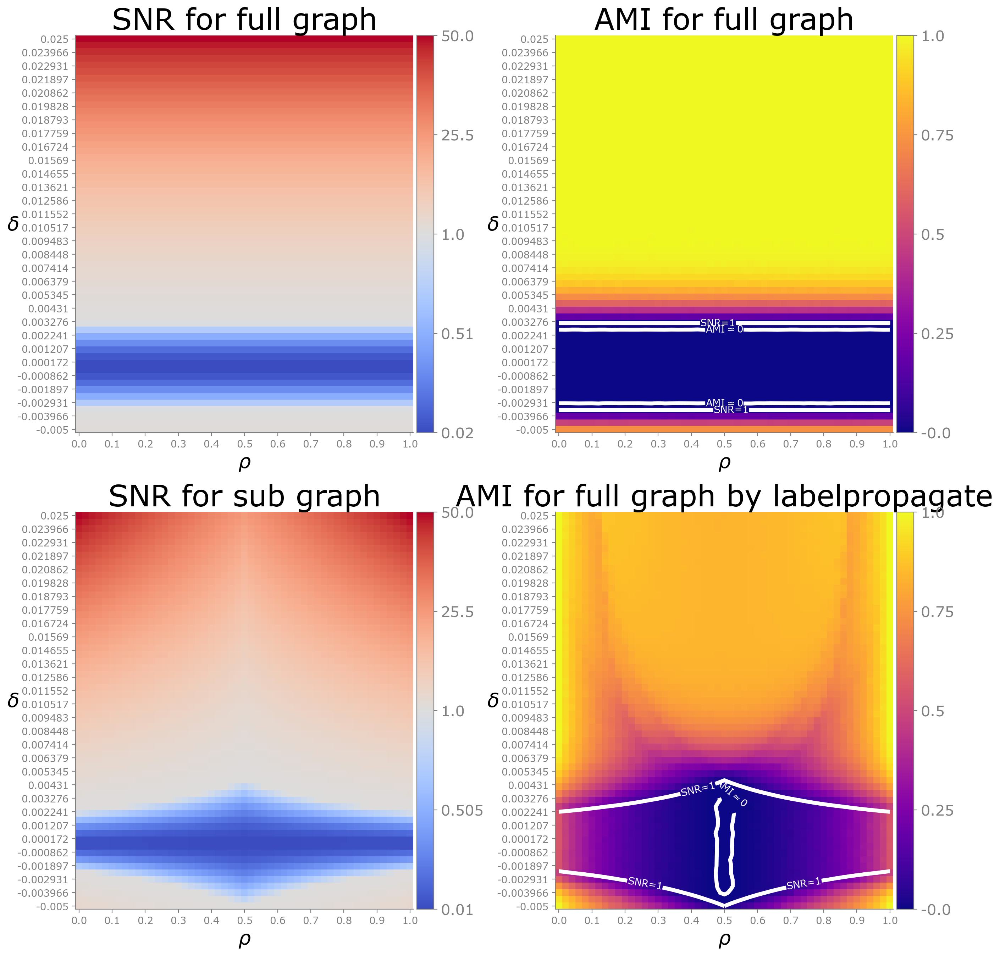

In [48]:
print(f"EXP {fileId} noGivenNumGroup add")
selfplot_labelpropagate(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)

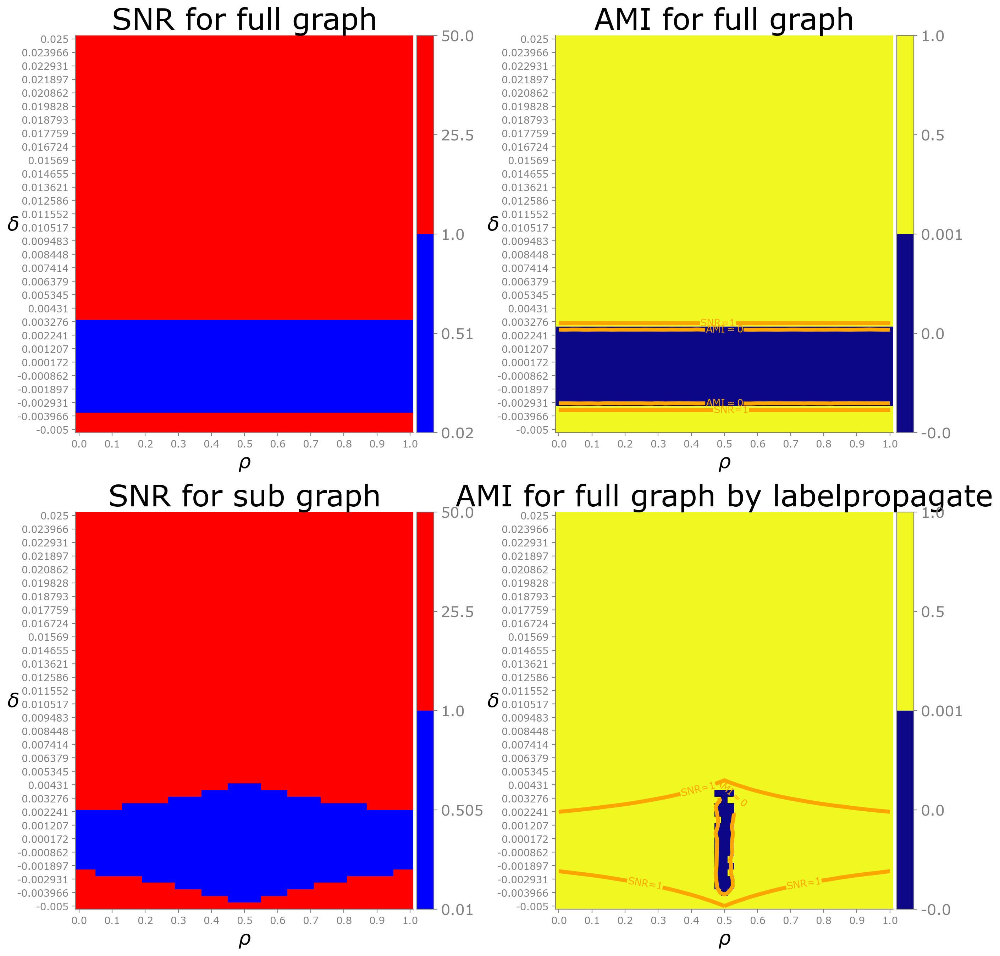

In [49]:
selfplot_labelpropagate(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=True)

In [9]:
X = 2
Z = 3
n = X*Z*2000
d = 50
rho = 0.1 # 0.3
delta = 0.1207 # 0.16724
pin = d / n + delta * (1 - 1 / (X * Z))
pout = d / n - delta / (X * Z)
pin = 0 if pin < 1e-10 else pin
pout = 0 if pout < 1e-10 else pout
msbm = SymMetaSBM(n, X, Z, rho, pin, pout)
result_data = synthetic_exp_full2full(msbm, verbose=True)
A = msbm.sample()
full_num_groups_given = np.size(np.unique(msbm.groupId))
print(f'Number of group for full graph is {full_num_groups_given}, detected by BH is {result_data[2]}, detected by LabelPropagate is {result_data[3]}')

Metadata generation done!
number of groups = 6
number of groups = 6
number of groups = 6
Number of partition by concatenate sub partition is 12
iter 0, diff=19847.486762959696
iter 1, diff=1797.770519117623
iter 2, diff=179.75913760844097
iter 3, diff=17.97420627786382
iter 4, diff=1.797249966848071
iter 5, diff=0.1797079322887152
iter 6, diff=0.01796908695161954
iter 7, diff=0.0017967380836805837
iter 8, diff=0.00017965674881533774
iter 9, diff=1.7963969108279293e-05
iter 10, diff=1.7962263343410956e-06
iter 11, diff=1.796056032194133e-07
Number of partition by Two step labelpropagate is 12
Number of group for full graph is 6, detected by BH is 6, detected by LabelPropagate is 12


In [6]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = False
DC = False
HelpWithFull = False
LabelPropagate = True
fileId = 'amiExp11.5' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' \
                            f'{"givenNumGroup" if givenNumGroup else ""}_' \
                            f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' \
                            f'{"LabelPropagate" if LabelPropagate else ""}'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
# addfileId = 'amiExp8.8' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
#                  f'{"givenNumGroup" if givenNumGroup else ""}_' + \
#                  f'{"DC" if DC else ""}_{"HelpWithFull" if HelpWithFull else ""}_' + \
#                  f'{"LabelPropagate" if LabelPropagate else ""}' + '_add'
# addload_path = "./result/detectabilityWithMeta/" + addfileId + ".txt"
addload_path = None
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=False, add_path=addload_path)

EXP amiExp11.5_n=12000_X=2_Z=3_d=50_snr____LabelPropagate noGivenNumGroup add


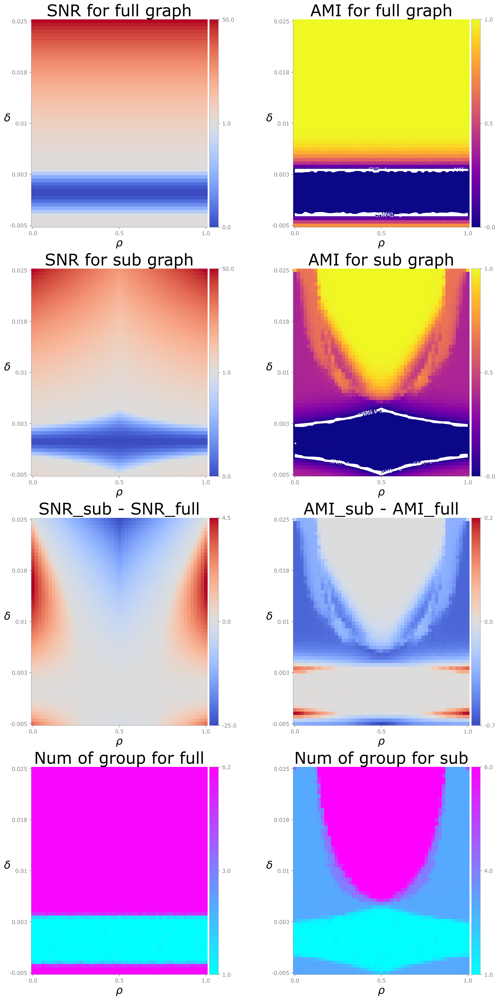

In [7]:
print(f"EXP {fileId} noGivenNumGroup add")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)

EXP amiExp11.5_n=12000_X=2_Z=3_d=50_snr____LabelPropagate noGivenNumGroup add


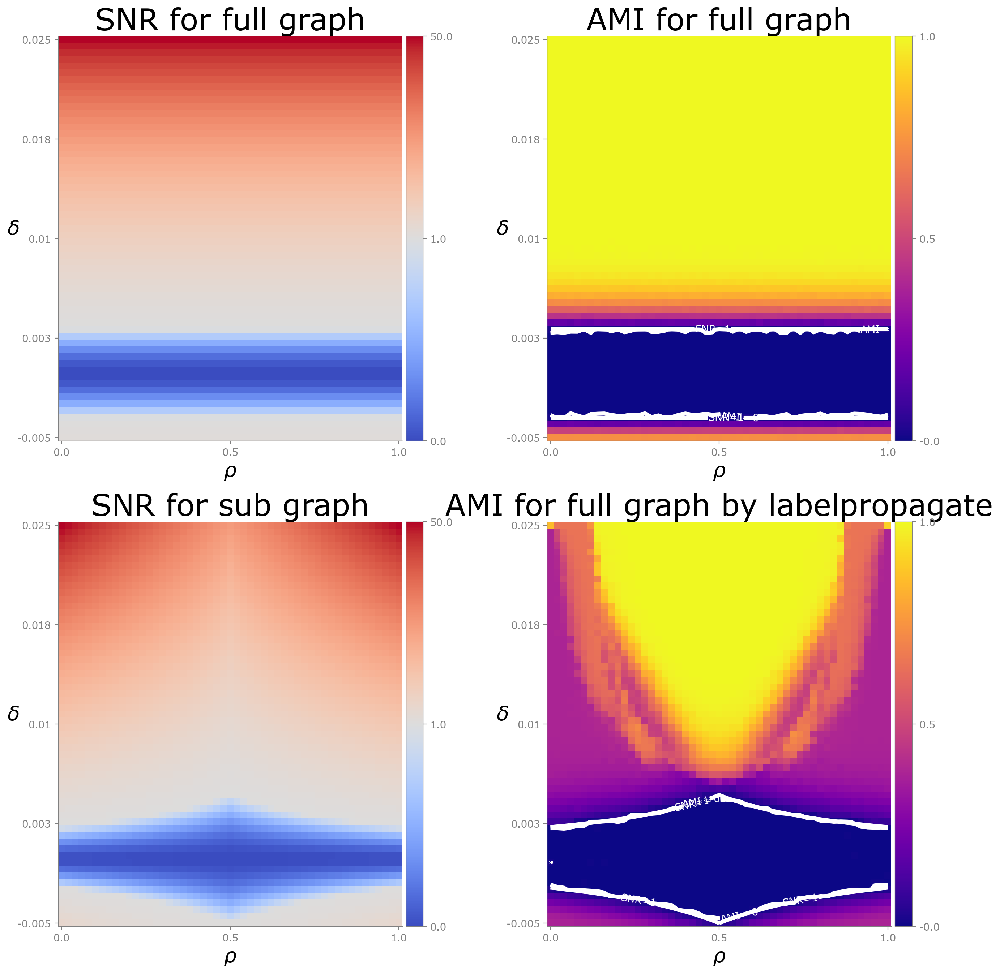

In [12]:
print(f"EXP {fileId} noGivenNumGroup add")
selfplot_labelpropagate(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)

# BP

In [6]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = True
BP = True
# fileId = 'amiExp10.9' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
#                  f'{"givenNumGroup" if givenNumGroup else ""}_' + \
#                  f'{"BP" if BP else ""}'
fileId = 'amiExp10.28' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
                 f'{"givenNumGroup" if givenNumGroup else ""}_' + \
                 f'{"BP" if BP else ""}_adjustrho'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
addload_path = None
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=False, add_path=addload_path)

EXP amiExp10.28_n=12000_X=2_Z=3_d=50_snr_givenNumGroup_BP_adjustrho GivenNumGroup


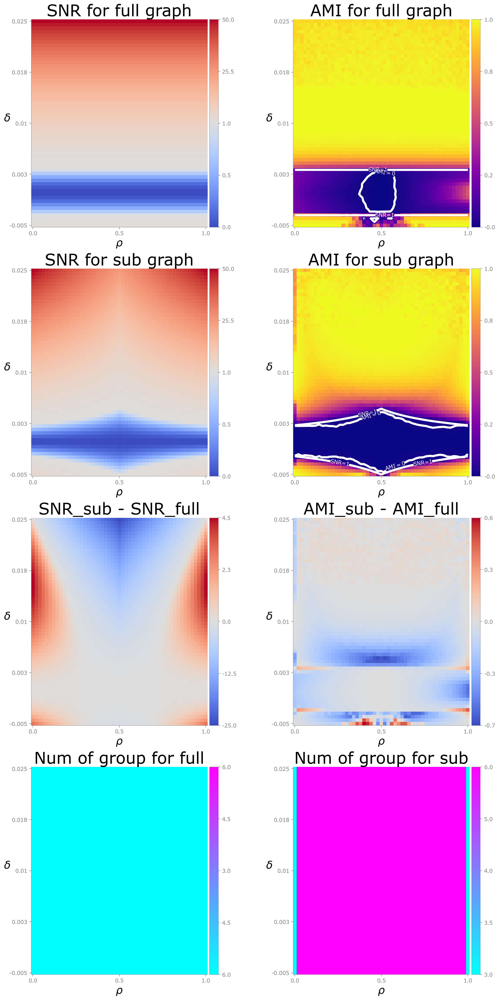

In [7]:
print(f"EXP {fileId} GivenNumGroup")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)

In [9]:
# For big n
X = 2
Z = 3
n = X*Z*2000
d = 50
Withsnr = True
givenNumGroup = True
BP = True
# fileId = 'amiExp10.9' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
#                  f'{"givenNumGroup" if givenNumGroup else ""}_' + \
#                  f'{"BP" if BP else ""}'
fileId = 'amiExp11.14' + f'_n={n}_X={X}_Z={Z}_d={round(d)}_{"snr" if Withsnr else ""}_' + \
                 f'{"givenNumGroup" if givenNumGroup else ""}_' + \
                 f'{"BP" if BP else ""}_corrected'
load_path = "./result/detectabilityWithMeta/" + fileId + ".txt"
addload_path = None
plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group = read_exp(load_path=load_path, Withsnr=Withsnr, givenNumGroup=givenNumGroup, old=False, add_path=addload_path)

EXP amiExp11.14_n=12000_X=2_Z=3_d=50_snr_givenNumGroup_BP_corrected GivenNumGroup


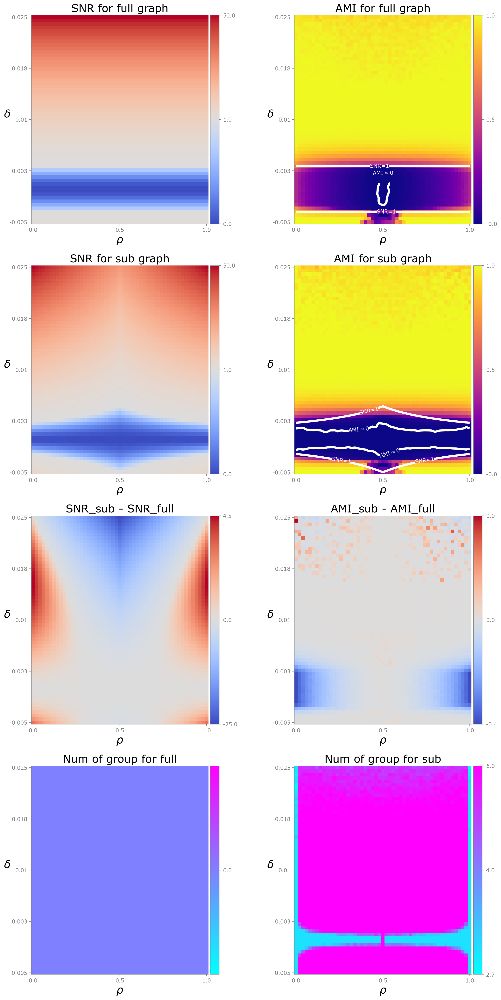

In [12]:
print(f"EXP {fileId} GivenNumGroup")
selfplot(plot_rhos, plot_zs, full_ami, sub_ami, snr_nm, snr_m, full_num_group, sub_num_group, clearcolor=False)